<a href="https://colab.research.google.com/github/ajj-shadowulf/ajj_dune/blob/main/process_image_testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pillow pytesseract requests

In [2]:
!sudo apt-get update
!sudo apt-get install -y tesseract-ocr libtesseract-dev tesseract-ocr-jpn

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,750 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,776 kB]
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 http://archive.ubuntu.com/ubuntu jammy-up


🔍 Processing 4d11cda2-244f-4b90-adf6-d4f127c3b999


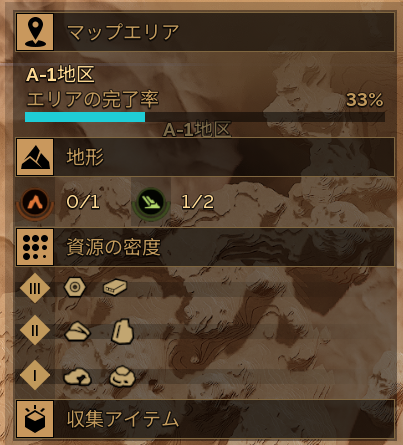

🔧 Resized image to (806, 890)


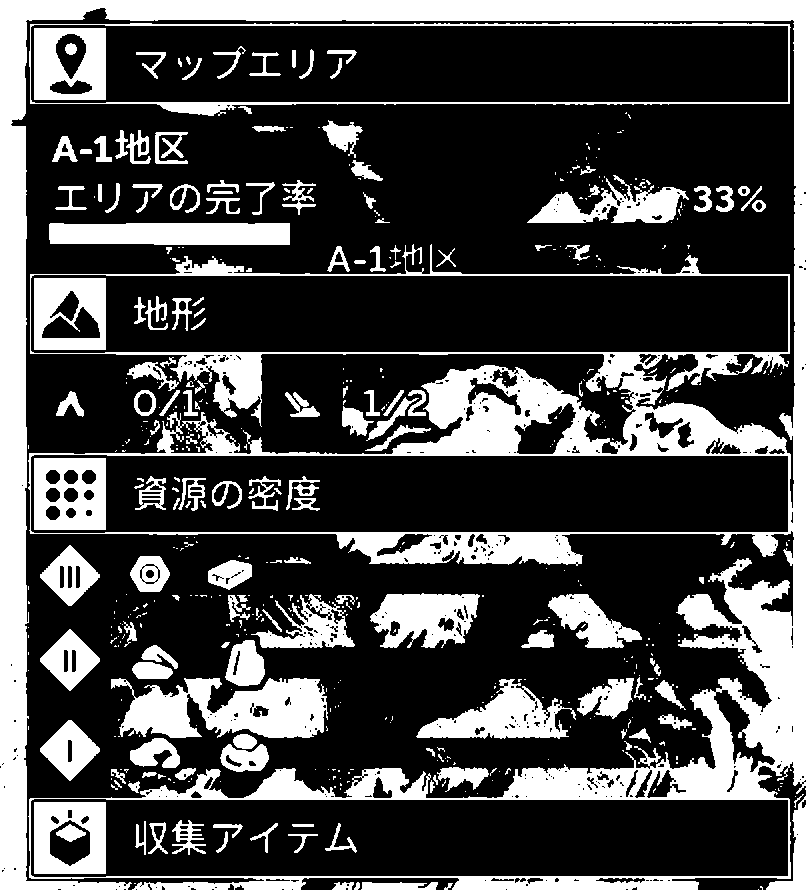

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | マップエリ

A-1地区

ww

エリアの完了率

Pore

saas 和A-1地区

Mi -由

人有馬湖

エコ

A  Erik:

ae

fom

ott wal ie:

EE

fl

ee

Ps

スモ

ee F me

pe

>

eats 2

Pe

kh

aaa lll?

  のの
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing d0804dd4-00f0-4329-9a63-b52e7646da5d


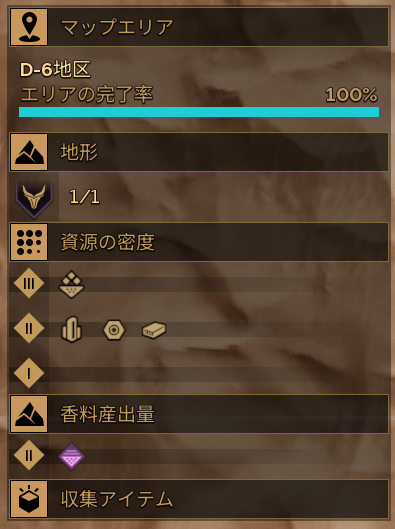

🔧 Resized image to (790, 1058)


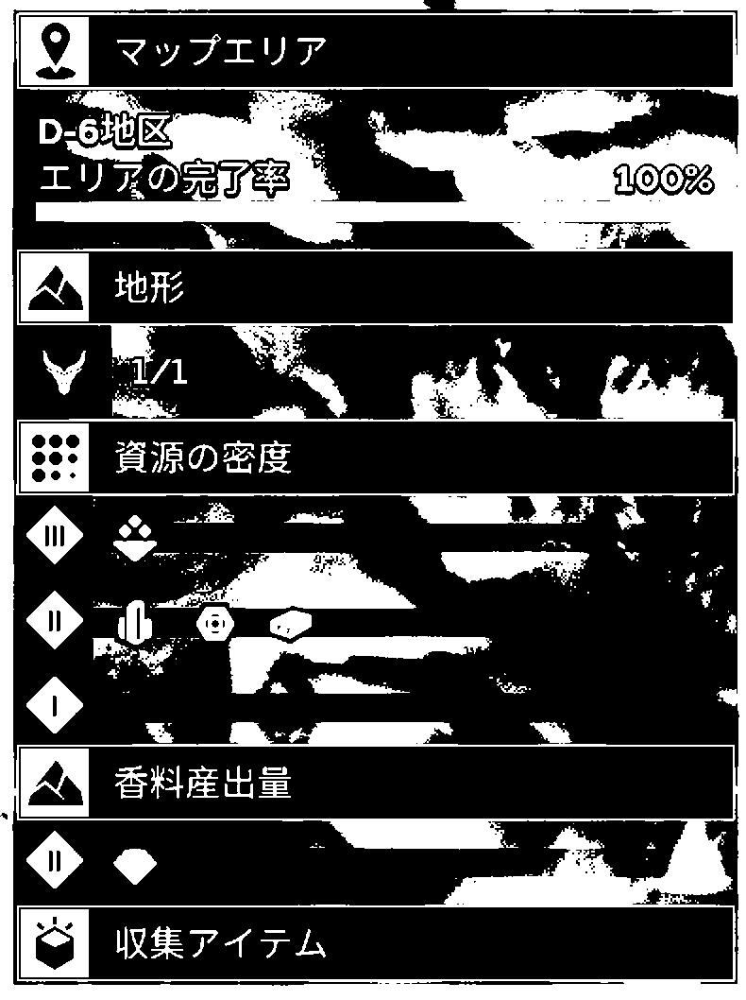

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 に2229ル

D-

6地図

エリの完

ves

LOOK

yes

OFZ

y

a:

3

33:

a

oe

し

ンコ

a
✅ Found area code: D-6
📌 Detected Area Code: D-6


In [20]:
import os
import json
import requests
from io import BytesIO
from PIL import Image, ImageOps, ImageEnhance
import pytesseract
import re
from IPython.display import display

UPLOADCARE_CDN_BASE = "https://ucarecdn.com"

# Add UUIDs you want to test here
TEST_UUIDS = [
    "4d11cda2-244f-4b90-adf6-d4f127c3b999",  # A-1 that failed
    "d0804dd4-00f0-4329-9a63-b52e7646da5d"
    # Add more UUIDs here
]

def extract_area_code(text):
    # Preprocess: flatten line breaks that may separate 'D-' and '6'
    flattened = text.replace("\n", " ").replace(" ", "")

    # Match formats like A-1, D-6, etc., possibly followed by 地区, 地図, etc.
    match = re.search(r'([A-Z]-\d)[^A-Z\d]?[地区図]?', flattened)

    if match:
        print(f"✅ Found area code: {match.group(1)}")
        return match.group(1)
    else:
        print("⚠️ No area code found in text. Raw text was:\n", text)
        return None

def preprocess_image(img):
    img = ImageOps.grayscale(img)
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(2.0)

    if img.width < 1000:
        img = img.resize((img.width * 2, img.height * 2))

    return img

def process_image(uuid):
    print(f"\n🔍 Processing {uuid}")

    # Download image
    url = f"{UPLOADCARE_CDN_BASE}/{uuid}/"
    response = requests.get(url)
    response.raise_for_status()

    # Load and display image
    img = Image.open(BytesIO(response.content)).convert("RGB")
    display(img)

    # Convert to grayscale
    gray = ImageOps.grayscale(img)

    # Resize up if small
    if gray.width < 1000:
        gray = gray.resize((gray.width * 2, gray.height * 2))
        print(f"🔧 Resized image to {gray.size}")

    # Enhance contrast
    gray = ImageOps.autocontrast(gray)
    gray = ImageOps.equalize(gray)

    # Optional thresholding (you can comment this line out if it worsens results)
    gray = gray.point(lambda p: 255 if p > 180 else 0)

    # Display processed version
    display(gray)

    # OCR config: try sparse text mode
    config = "--psm 11"
    print(f"🧠 Using OCR config: lang='jpn+eng', config='{config}'")

    text = pytesseract.image_to_string(gray, lang='jpn+eng', config=config)

    clean_text = text.strip()
    print("📝 OCR Text:\n", clean_text)

    area_code = extract_area_code(clean_text)

    print(f"📌 Detected Area Code: {area_code or '[None]'}")

    return {
        "uuid": uuid,
        "text": clean_text,
        "area_code": area_code or ""
    }

if __name__ == "__main__":
    for uuid in TEST_UUIDS:
        try:
            process_image(uuid)
        except Exception as e:
            print(f"❌ Error processing {uuid}: {e}")

In [16]:
def process_image(uuid):
    print(f"\n🔍 Processing {uuid}")

    # Download image
    url = f"{UPLOADCARE_CDN_BASE}/{uuid}/"
    response = requests.get(url)
    response.raise_for_status()

    # Load and display image
    img = Image.open(BytesIO(response.content)).convert("RGB")
    display(img)

    # Convert to grayscale
    gray = ImageOps.grayscale(img)

    # Resize up if small
    if gray.width < 1000:
        gray = gray.resize((gray.width * 2, gray.height * 2))
        print(f"🔧 Resized image to {gray.size}")

    # Enhance contrast
    gray = ImageOps.autocontrast(gray)
    gray = ImageOps.equalize(gray)

    # Optional thresholding (you can comment this line out if it worsens results)
    gray = gray.point(lambda p: 255 if p > 180 else 0)

    # Display processed version
    display(gray)

    # OCR config: try sparse text mode
    config = "--psm 11"
    print(f"🧠 Using OCR config: lang='jpn+eng', config='{config}'")

    text = pytesseract.image_to_string(gray, lang='jpn+eng', config=config)

    clean_text = text.strip()
    print("📝 OCR Text:\n", clean_text)

    area_code = extract_area_code(clean_text)

    print(f"📌 Detected Area Code: {area_code or '[None]'}")

    return {
        "uuid": uuid,
        "text": clean_text,
        "area_code": area_code or ""
    }


🔍 Processing 4d11cda2-244f-4b90-adf6-d4f127c3b999


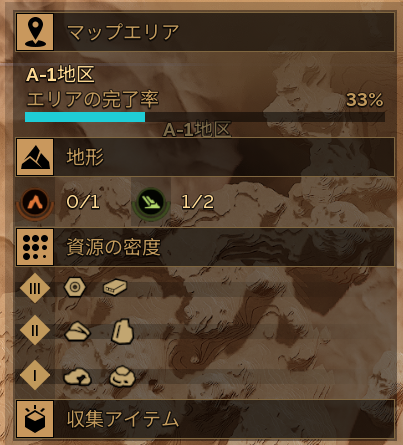

🔧 Resized image to (806, 890)


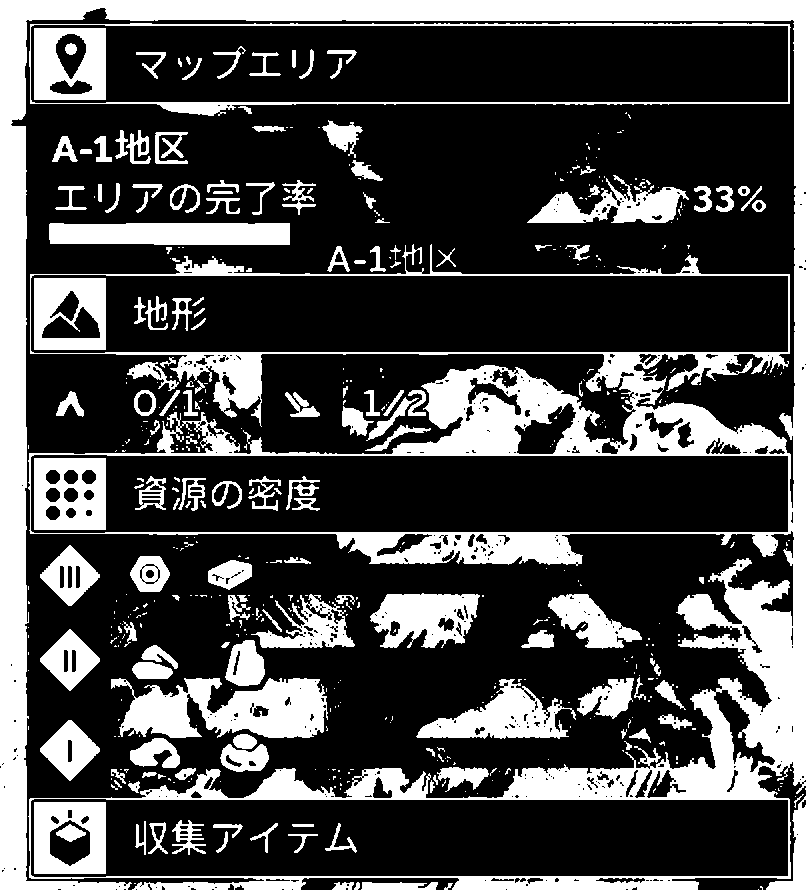

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | マップエリ

A-1地区

ww

エリアの完了率

Pore

saas 和A-1地区

Mi -由

人有馬湖

エコ

A  Erik:

ae

fom

ott wal ie:

EE

fl

ee

Ps

スモ

ee F me

pe

>

eats 2

Pe

kh

aaa lll?

  のの
✅ Found area code: A-1
📌 Detected Area Code: A-1


In [17]:
result = process_image("4d11cda2-244f-4b90-adf6-d4f127c3b999")


🔍 Processing d0804dd4-00f0-4329-9a63-b52e7646da5d


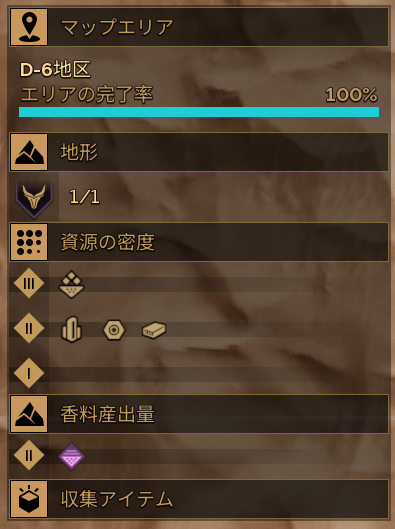

🔧 Resized image to (790, 1058)


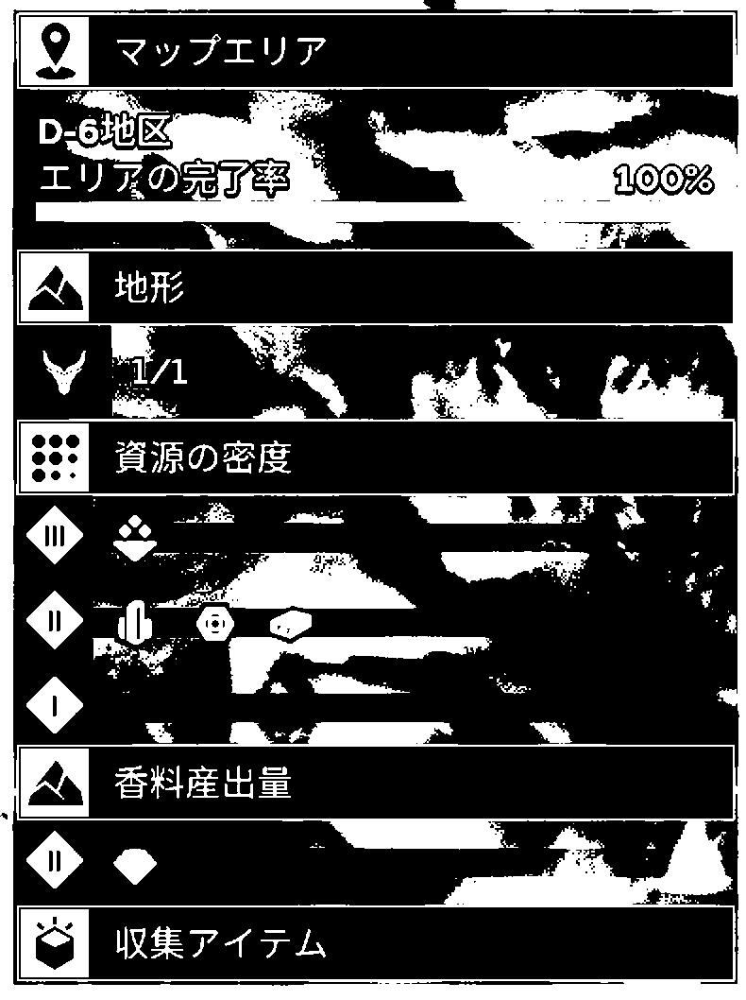

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 に2229ル

D-

6地図

エリの完

ves

LOOK

yes

OFZ

y

a:

3

33:

a

oe

し

ンコ

a
✅ Found area code: D-6
📌 Detected Area Code: D-6


In [18]:
result = process_image("d0804dd4-00f0-4329-9a63-b52e7646da5d")

In [30]:
TEST_UUIDS = [
    "2692560f-f165-4cfa-8c9c-b0aa269e5b9b",
    "fca911f4-377d-42ce-8513-8c7c8802d53a",
    "859048ba-e6d9-46c4-ae22-5ac78f10e7af",
    "a560377f-3ab8-44ec-b3d8-96fc6edc485d",
    "7aaf57ec-1e10-4c3e-ae6b-c4bbf9c3549e",
    "01017658-c7b4-4593-905f-4d23d94c3e09",
    "0cd19e9e-7dfe-4bc1-8174-9a9ae58435b3",
    "f057d552-6759-4775-88c3-fb464e37c629",
    "2318f874-8c97-439d-b40f-3a280f5ca5cd",
    "d553053c-54ee-43aa-9a1c-83b58a2b6ba6",
    "bad9bd3c-bdca-4729-90a6-8b8da3244ed9",
    "cb6ebd7f-139b-4d75-ba5c-2e1f536d15ca",
    "6b84ff2a-f8eb-4553-9296-7ab7d0051839",
    "3d634b57-de75-47a2-a51c-39f184c6341f",
    "7ad6e4e1-d9fc-43d4-84f4-232fb8b8b46f",
    "3d1d6c84-04ff-4450-af0b-9d7b9186fb1d",
    "22a94d90-e215-4f1b-b2bb-7435297b8d41",
    "25435605-31fc-4a32-ae9f-8caa4dce0b81",
    "d9c35f06-64c5-46c1-9d74-c9f92dbc55b3"
    # Add more UUIDs here
]


🔍 Processing 2692560f-f165-4cfa-8c9c-b0aa269e5b9b


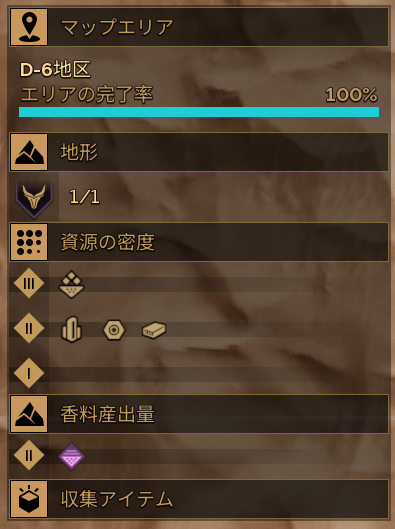

🔧 Resized image to (790, 1058)


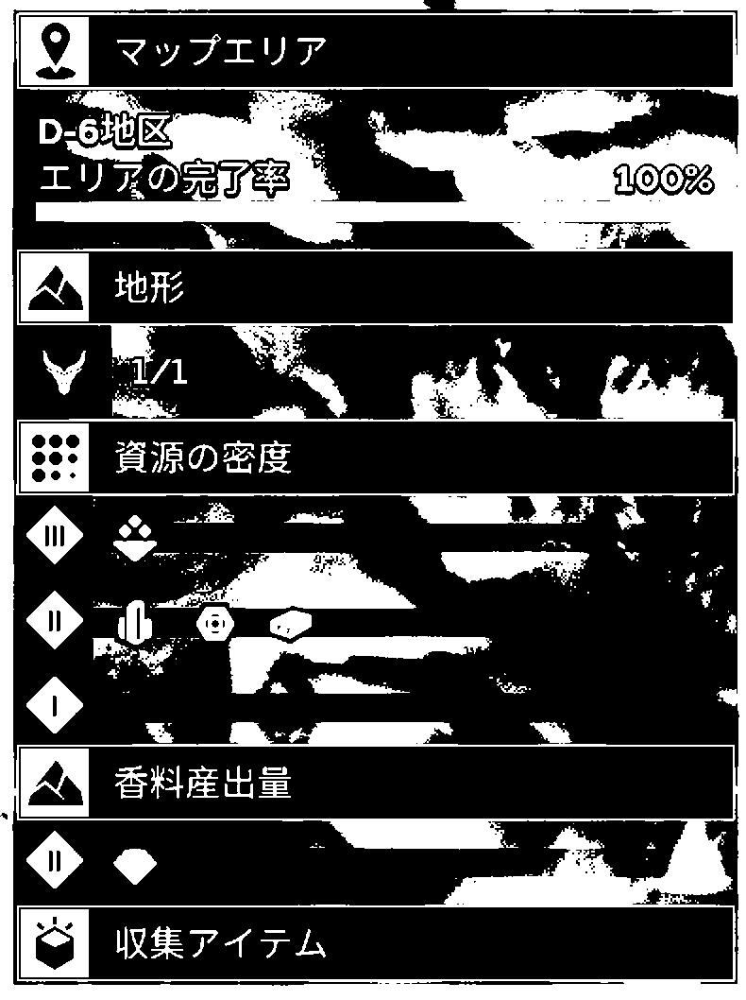

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 に2229ル

D-

6地図

エリの完

ves

LOOK

yes

OFZ

y

a:

3

33:

a

oe

し

ンコ

a
✅ Found area code: D-6
📌 Detected Area Code: D-6

🔍 Processing fca911f4-377d-42ce-8513-8c7c8802d53a


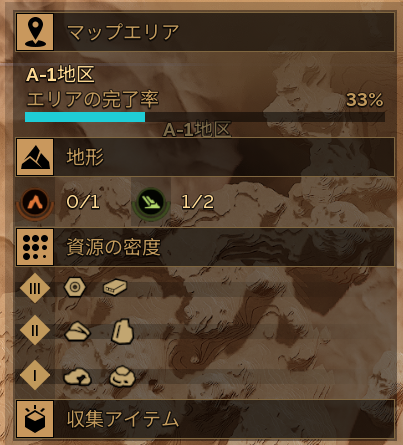

🔧 Resized image to (806, 890)


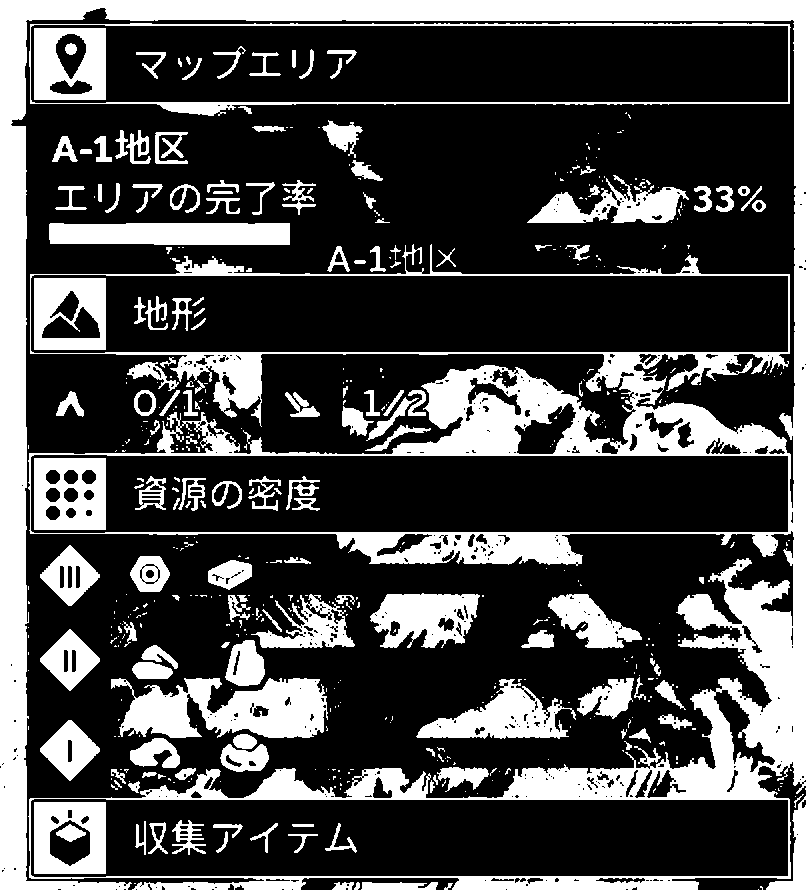

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | マップエリ

A-1地区

ww

エリアの完了率

Pore

saas 和A-1地区

Mi -由

人有馬湖

エコ

A  Erik:

ae

fom

ott wal ie:

EE

fl

ee

Ps

スモ

ee F me

pe

>

eats 2

Pe

kh

aaa lll?

  のの
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing 859048ba-e6d9-46c4-ae22-5ac78f10e7af


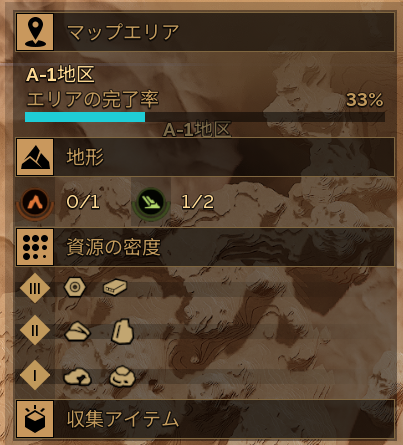

🔧 Resized image to (806, 890)


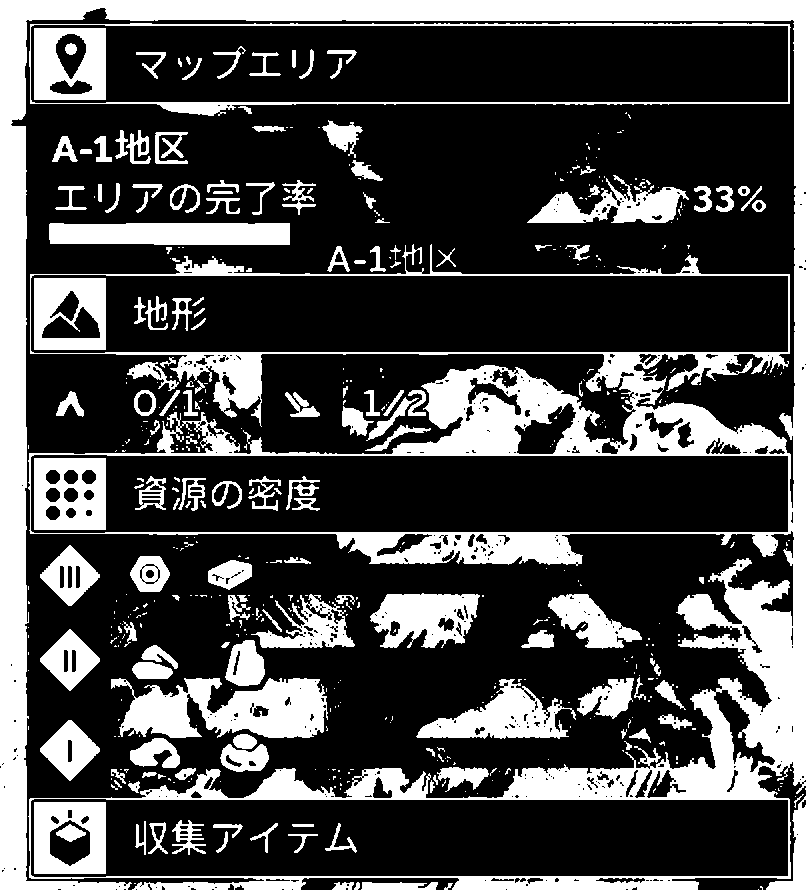

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | マップエリ

A-1地区

ww

エリアの完了率

Pore

saas 和A-1地区

Mi -由

人有馬湖

エコ

A  Erik:

ae

fom

ott wal ie:

EE

fl

ee

Ps

スモ

ee F me

pe

>

eats 2

Pe

kh

aaa lll?

  のの
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing a560377f-3ab8-44ec-b3d8-96fc6edc485d


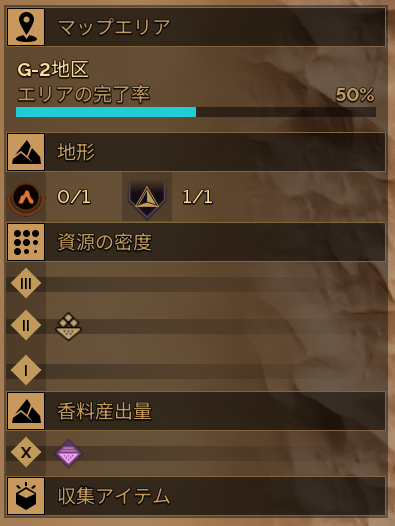

🔧 Resized image to (790, 1052)


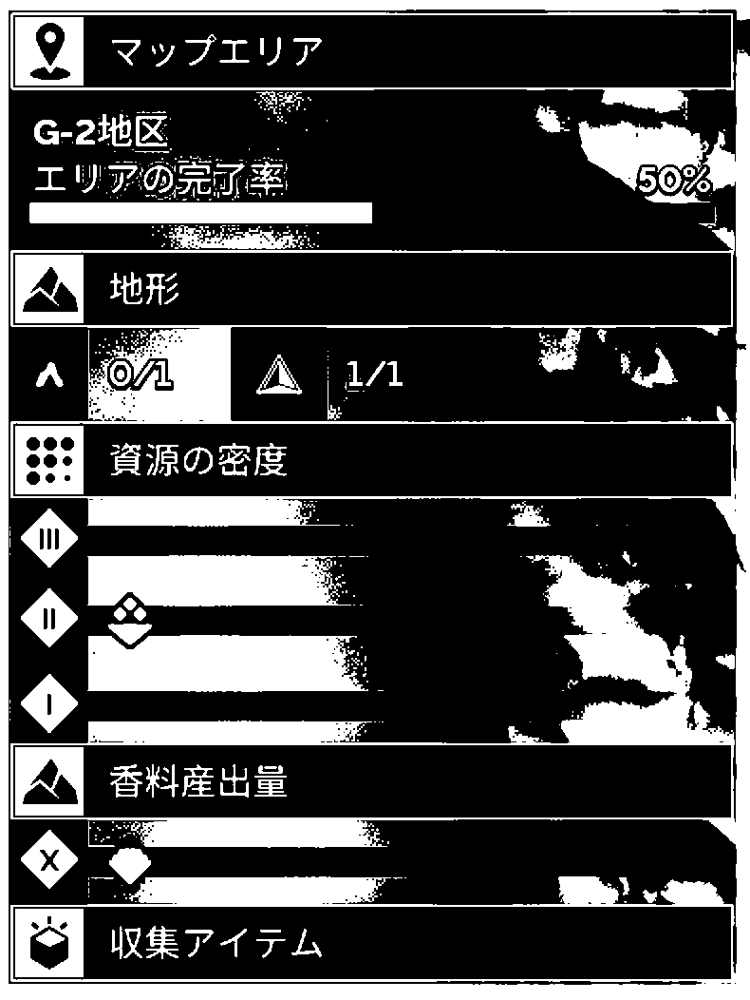

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 <の

エリ

人

地衣

nN  te

vr

EW anoz

3

トリ

oe

oe

-

1まこ
⚠️ No area code found in text. Raw text was:
 <の

エリ

人

地衣

nN  te

vr

EW anoz

3

トリ

oe

oe

-

1まこ
📌 Detected Area Code: [None]

🔍 Processing 7aaf57ec-1e10-4c3e-ae6b-c4bbf9c3549e


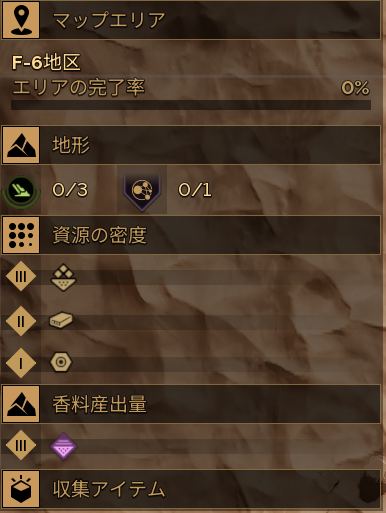

🔧 Resized image to (772, 1026)


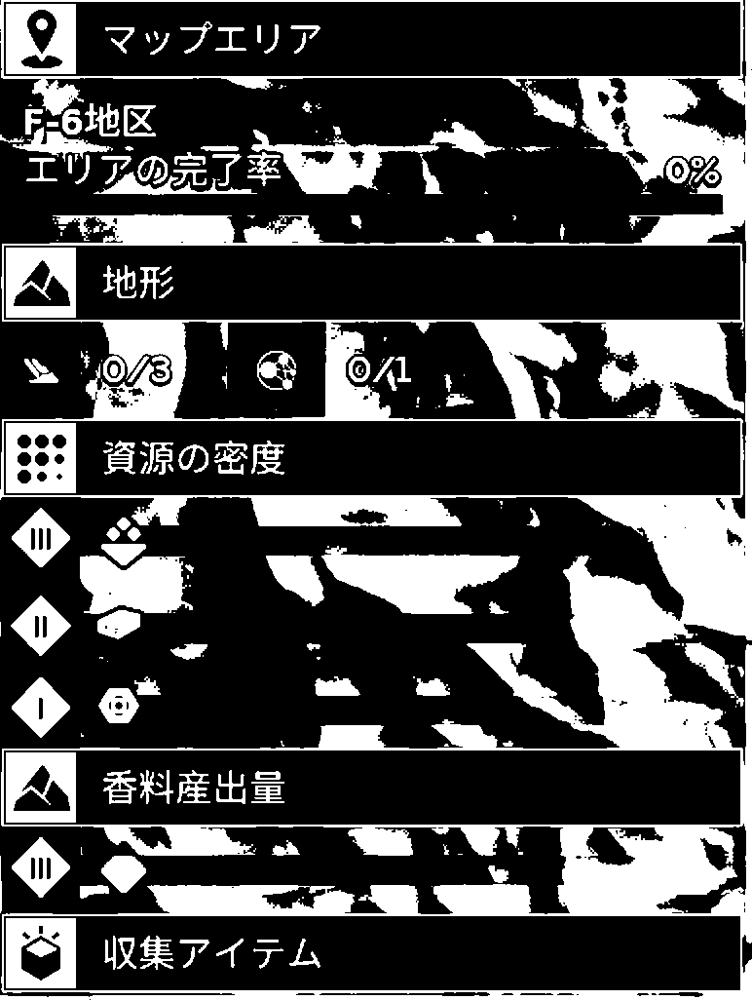

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9| kcを

_E=6地区

v3

@

エリフ BBE: ae   3

,  ry

t

al  2

S/S ME CO

Yo

Ed anoze

by.

いり

bd

[ フ

ベー

®

re

al

ha

a

o-

~~

ae

——

ーー =
⚠️ No area code found in text. Raw text was:
 9| kcを

_E=6地区

v3

@

エリフ BBE: ae   3

,  ry

t

al  2

S/S ME CO

Yo

Ed anoze

by.

いり

bd

[ フ

ベー

®

re

al

ha

a

o-

~~

ae

——

ーー =
📌 Detected Area Code: [None]

🔍 Processing 01017658-c7b4-4593-905f-4d23d94c3e09


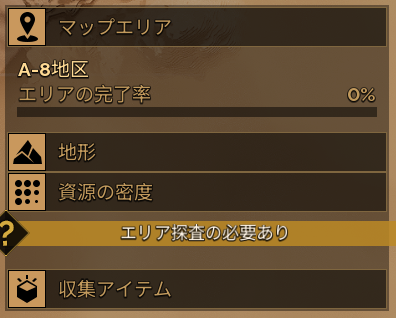

🔧 Resized image to (792, 636)


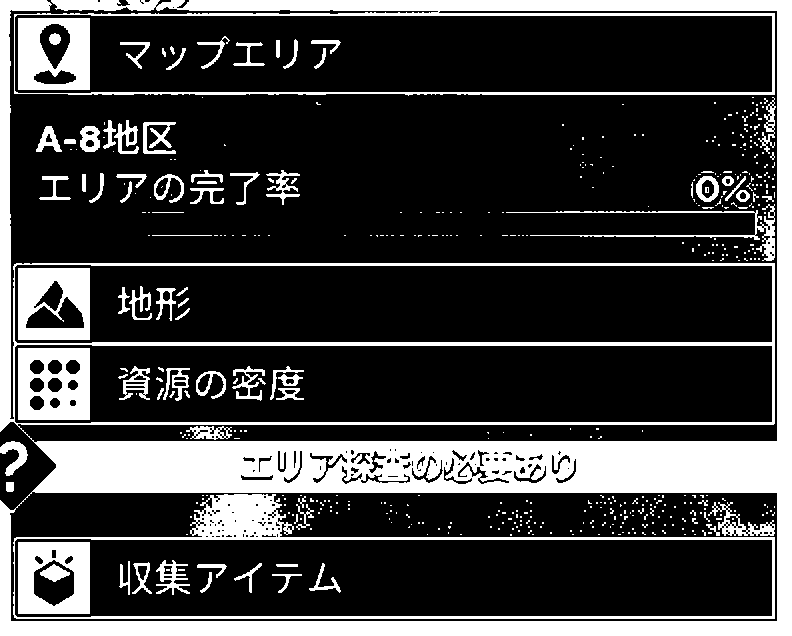

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 teenies

A-8地区

ルンた

a

  地形

33: Fe

diac

OU PE

ウ

| rT ean
✅ Found area code: A-8
📌 Detected Area Code: A-8

🔍 Processing 0cd19e9e-7dfe-4bc1-8174-9a9ae58435b3


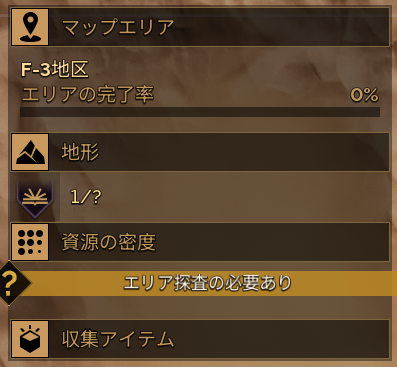

🔧 Resized image to (794, 734)


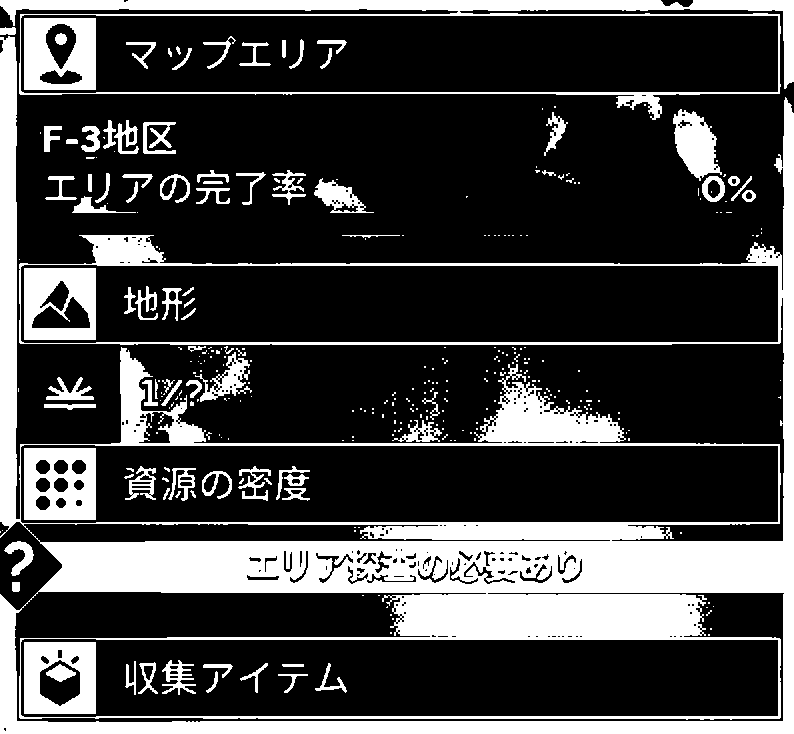

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 1]   マップエリア

1?|

ーー |

F-3地区

—

id

%

eee

9%

18

2

ーー

:

33: Fe

i

OBE

rl

Mszeクの

Fy wars.
✅ Found area code: F-3
📌 Detected Area Code: F-3

🔍 Processing f057d552-6759-4775-88c3-fb464e37c629


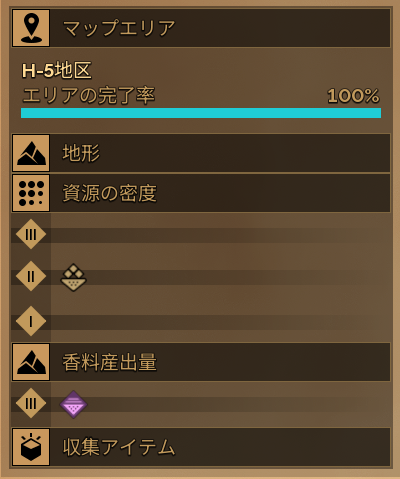

🔧 Resized image to (800, 958)


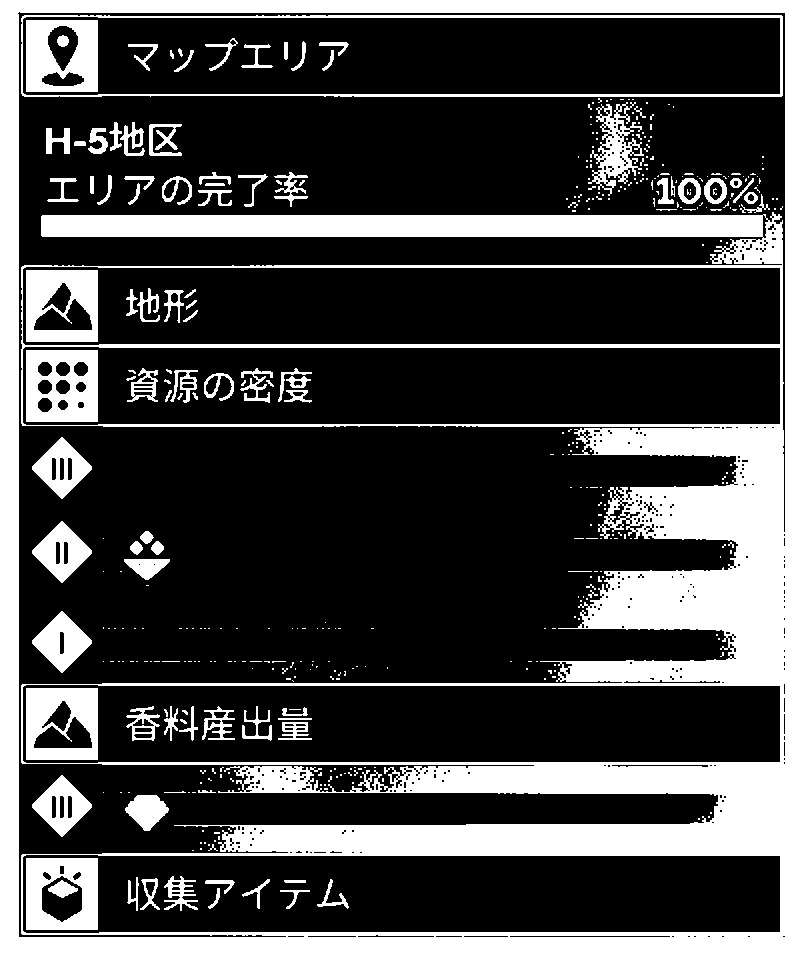

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 Bq yx?

H-5地区

エリアの完了率

100%

  ig

 資源の密度

oe

Bee wi

a

Fy wars.

モミミレニニニニーー
✅ Found area code: H-5
📌 Detected Area Code: H-5

🔍 Processing 2318f874-8c97-439d-b40f-3a280f5ca5cd


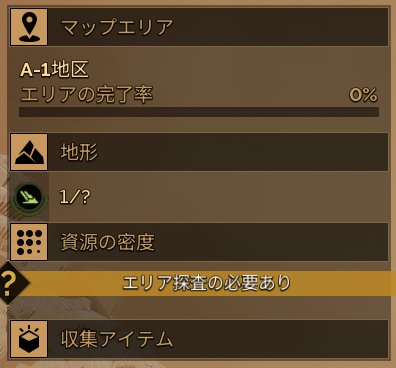

🔧 Resized image to (792, 736)


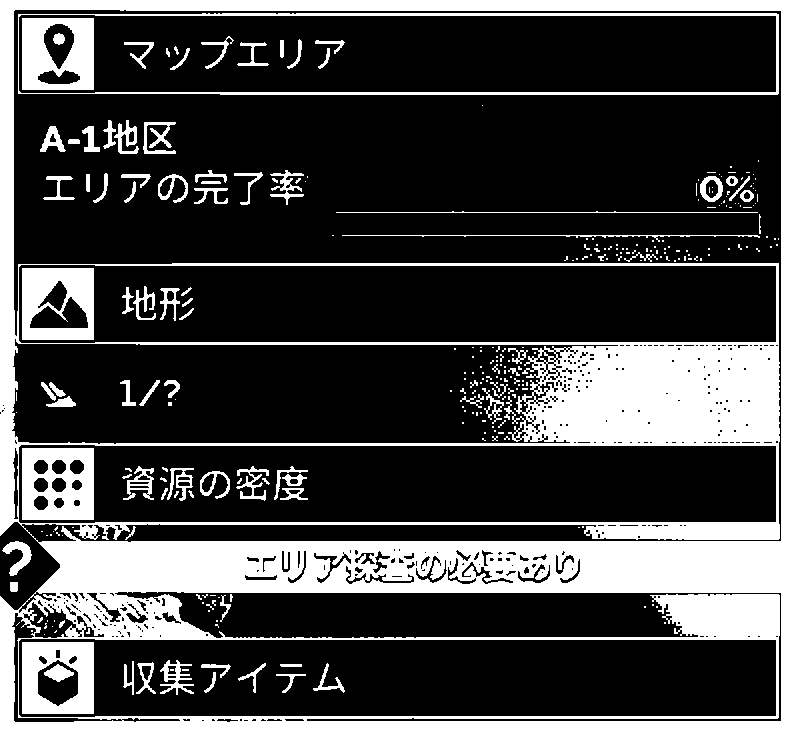

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | にシアだリリ

A-1地区

a AOb, Bee

O%

Ub

占い

1/?

—

=r ARES

WERE

A aatdle)

= WORT FL

—————
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing d553053c-54ee-43aa-9a1c-83b58a2b6ba6


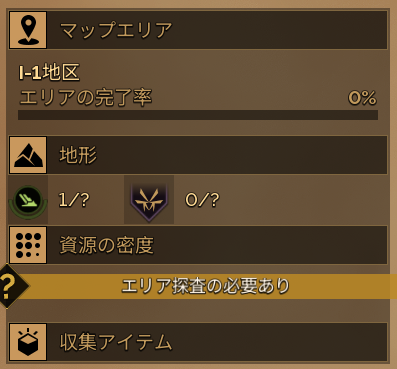

🔧 Resized image to (794, 738)


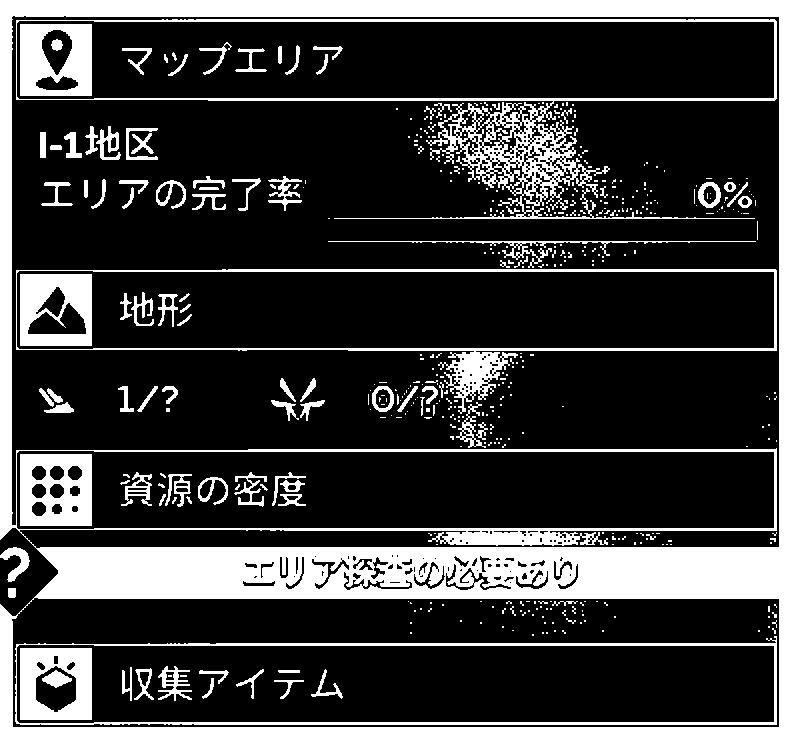

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | マップエリ

ト1地区

【9 3

a Ab Bee

etal

ae

| Aa fESzZ

SS

トン

アク4

6)

店  資源の密度

=r Wy AREY

0 yy

——
⚠️ No area code found in text. Raw text was:
 9 | マップエリ

ト1地区

【9 3

a Ab Bee

etal

ae

| Aa fESzZ

SS

トン

アク4

6)

店  資源の密度

=r Wy AREY

0 yy

——
📌 Detected Area Code: [None]

🔍 Processing bad9bd3c-bdca-4729-90a6-8b8da3244ed9


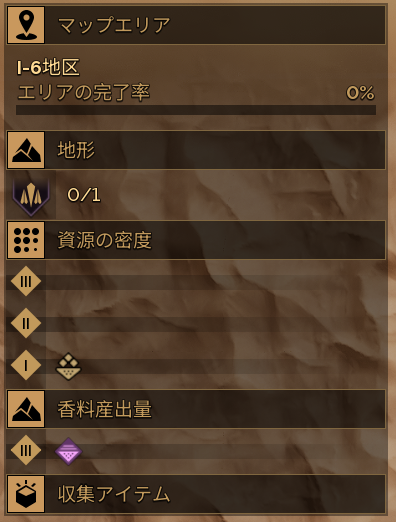

🔧 Resized image to (792, 1044)


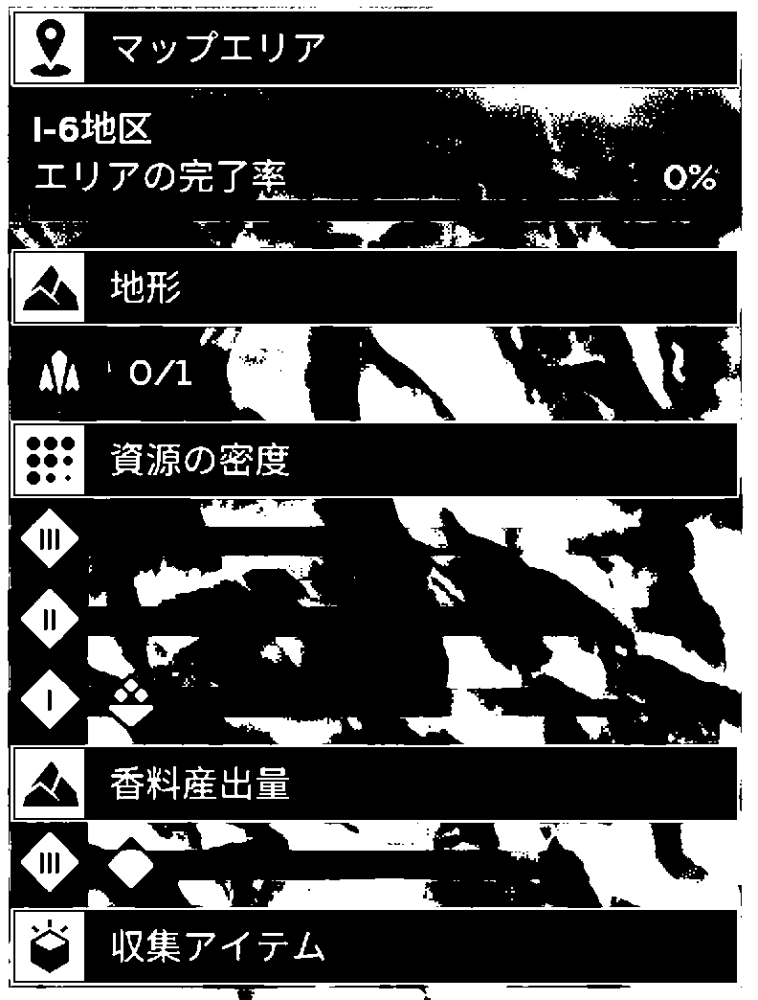

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 ーーーーー-

| 9 に2229ル

ト6地区

ane PORTH _

os

にEPR

0の

ーー- ョュー

ーュャューー

2

Ma

O/1

a

}*

oe

cau Sic ane

a

ムへ て
⚠️ No area code found in text. Raw text was:
 ーーーーー-

| 9 に2229ル

ト6地区

ane PORTH _

os

にEPR

0の

ーー- ョュー

ーュャューー

2

Ma

O/1

a

}*

oe

cau Sic ane

a

ムへ て
📌 Detected Area Code: [None]

🔍 Processing cb6ebd7f-139b-4d75-ba5c-2e1f536d15ca


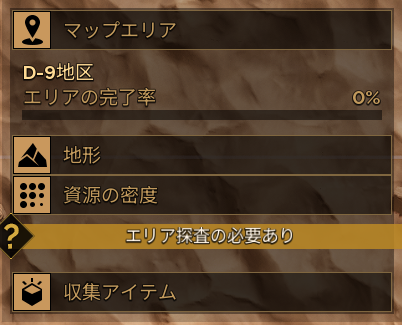

🔧 Resized image to (804, 650)


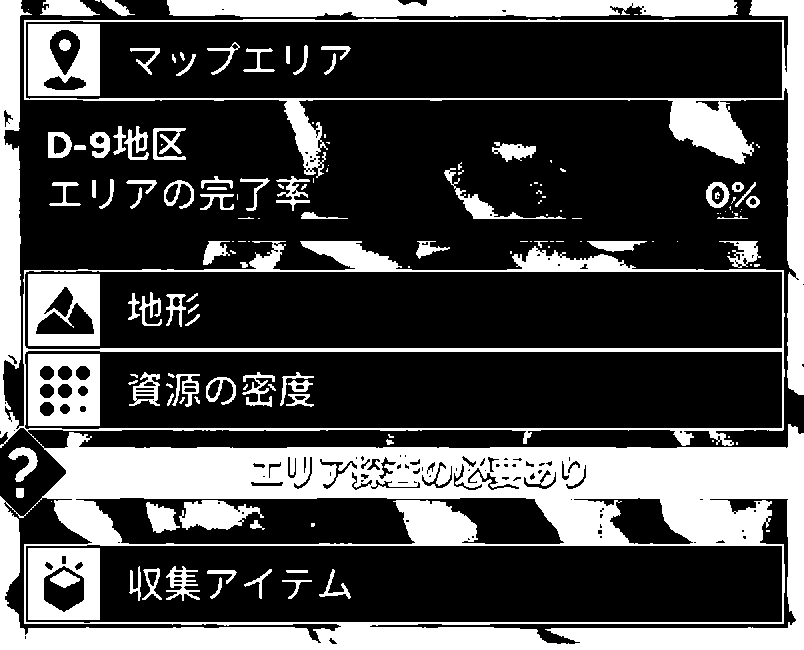

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 Ke

ップエリア

D-9地区

|

9%%

エリアの完了率

ae

F

  ig

Ed anoze

WARE DEY

て 3

S| gcが
✅ Found area code: D-9
📌 Detected Area Code: D-9

🔍 Processing 6b84ff2a-f8eb-4553-9296-7ab7d0051839


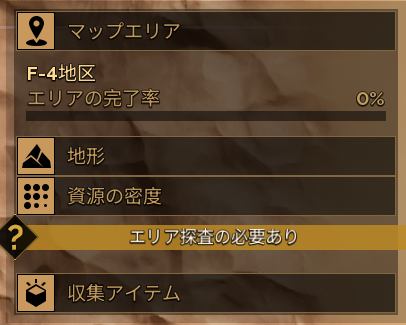

🔧 Resized image to (812, 650)


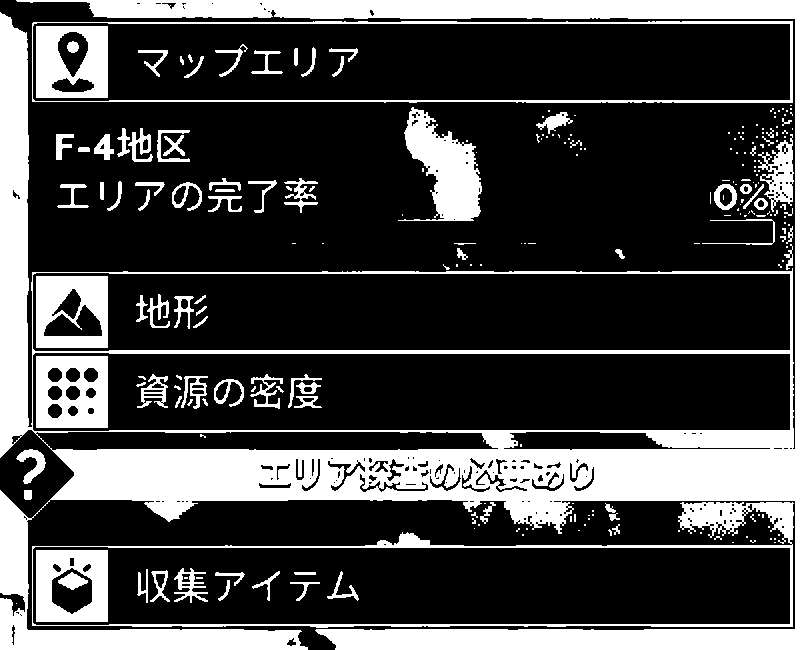

🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 9 | ET

F-4地区

LO

中 アの完了率

  ig

Fd anoze

ウ

aa Feo aE

| 2をの
✅ Found area code: F-4
📌 Detected Area Code: F-4


In [25]:
    for uuid in TEST_UUIDS:
        try:
            process_image(uuid)
        except Exception as e:
            print(f"❌ Error processing {uuid}: {e}")


🔍 Processing 2692560f-f165-4cfa-8c9c-b0aa269e5b9b

🔧 Resized image to (764, 1024)


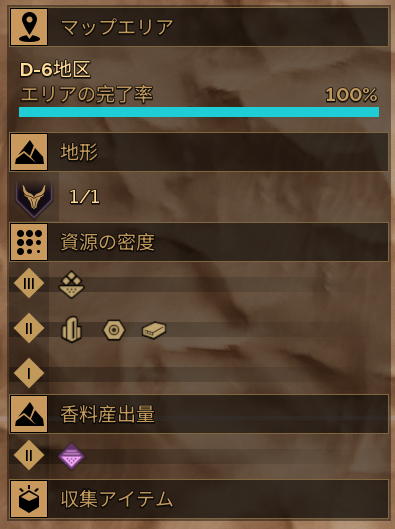


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 22220

D-6地区

na Ay ae =

100%

So Bi

1/1

33: ET ona

oe

0 ht oO る

人る

香料産出量

54

| 収集アイテム
✅ Found area code: D-6
📌 Detected Area Code: D-6

🔍 Processing fca911f4-377d-42ce-8513-8c7c8802d53a

🔧 Resized image to (927, 1024)


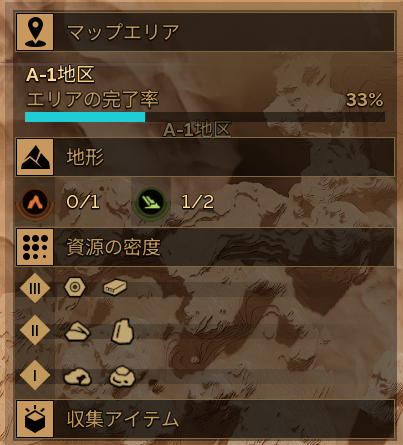


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 A-1地区

33%

PaO ae

es eee

人

pi

HW)

入 0ノZ1

Ss

Wa

$33] 資源の密度

i

ae)

Ee

て

に

Co
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing 859048ba-e6d9-46c4-ae22-5ac78f10e7af

🔧 Resized image to (927, 1024)


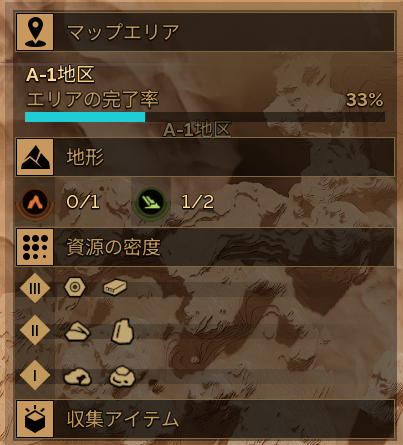


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 A-1地区

33%

PaO ae

es eee

人

pi

HW)

入 0ノZ1

Ss

Wa

$33] 資源の密度

i

ae)

Ee

て

に

Co
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing a560377f-3ab8-44ec-b3d8-96fc6edc485d

🔧 Resized image to (768, 1024)


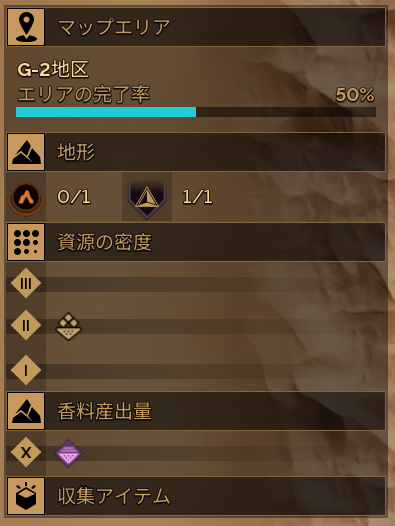


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 G-2地区

エリア 4のと

50%

ーーー

回時 し

reer al

3

1/1

和泊の補度

®

ママ

Ox

aE eae            ー
✅ Found area code: G-2
📌 Detected Area Code: G-2

🔍 Processing 7aaf57ec-1e10-4c3e-ae6b-c4bbf9c3549e

🔧 Resized image to (770, 1024)


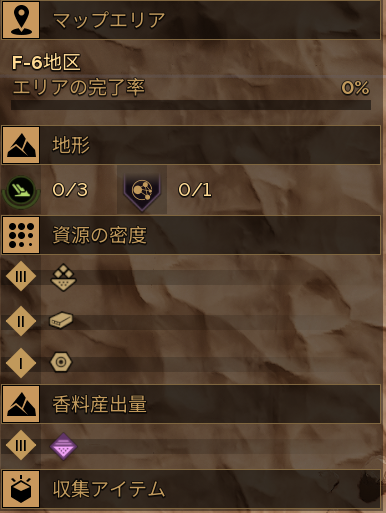


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 F-6地区

エリアの完了率

02%

&

0/3

の

0/1

$3? epee

トス2

i

に

i
✅ Found area code: F-6
📌 Detected Area Code: F-6

🔍 Processing 01017658-c7b4-4593-905f-4d23d94c3e09

🔧 Resized image to (1275, 1024)


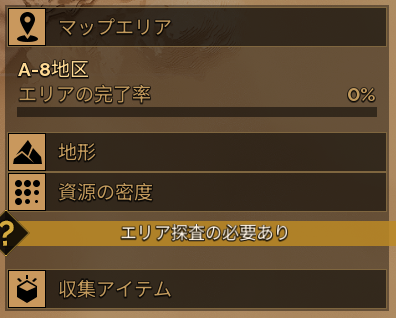


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 ーー

A-8地区

エリアの完了率

ey

sa

4

$32  資源の密度

ごいっす

GPU

YF

any

<

り

Fal errs.
✅ Found area code: A-8
📌 Detected Area Code: A-8

🔍 Processing 0cd19e9e-7dfe-4bc1-8174-9a9ae58435b3

🔧 Resized image to (1107, 1024)


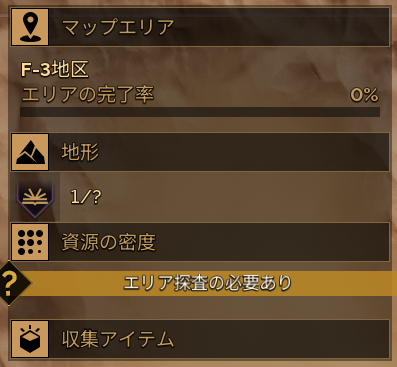


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 F-3地区

AOE me

Or

人

SHA

ee A

Je のの

D

GPU

DF

7リン

<ごに>っ

red

り

 とみ4
✅ Found area code: F-3
📌 Detected Area Code: F-3

🔍 Processing f057d552-6759-4775-88c3-fb464e37c629

🔧 Resized image to (855, 1024)


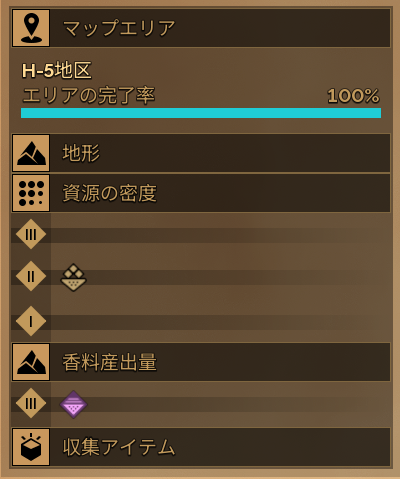


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 H-5地区

エリアの完了率

100%

人る

地形

$23| =e Oars

} a

人

にあらcm

Vv

Fy werrs.
✅ Found area code: H-5
📌 Detected Area Code: H-5

🔍 Processing 2318f874-8c97-439d-b40f-3a280f5ca5cd

🔧 Resized image to (1101, 1024)


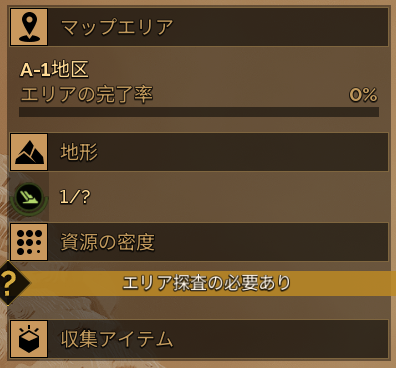


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 A-1地区

エリアの完了率

O%

人

pi

We

レン

$32] 資源の密度

GPU

DF

andy

roan

reed

り

Ey werss.
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing d553053c-54ee-43aa-9a1c-83b58a2b6ba6

🔧 Resized image to (1101, 1024)


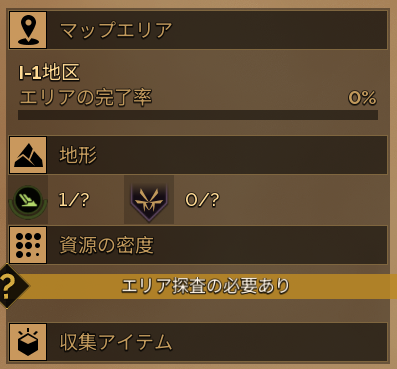


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 11地区

エリアの完了率

or

subi

4

いつ

レグ

を

0/?

$32] 資源の密度

rece

GPU

VF

7リル

<とぴの

り

© あと4
⚠️ No area code found in text.
📌 Detected Area Code: [None]

🔍 Processing bad9bd3c-bdca-4729-90a6-8b8da3244ed9

🔧 Resized image to (776, 1024)


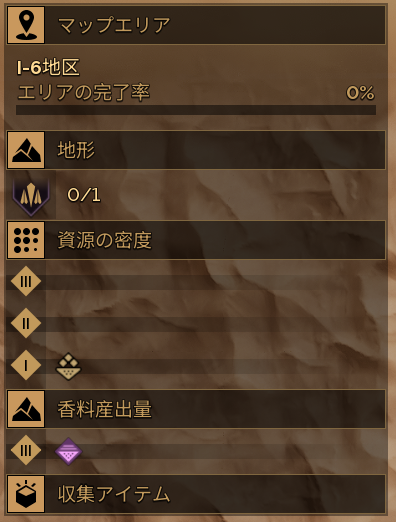


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 6地区

リフ の完了率

(ors

かUI

O/1

33: etwas

0 =

の 香料産出量
⚠️ No area code found in text.
📌 Detected Area Code: [None]

🔍 Processing cb6ebd7f-139b-4d75-ba5c-2e1f536d15ca

🔧 Resized image to (1266, 1024)


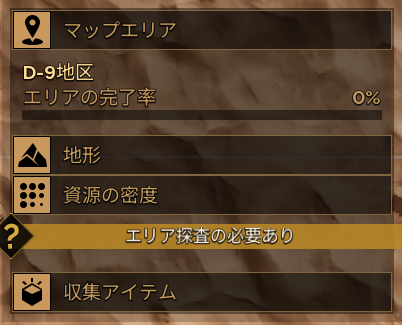


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 D-9地区

エリアの完了率

Or

4

pi

Le  AROBE

SF0

YF

4   WEST ea

ロッ)

め

加emze
✅ Found area code: D-9
📌 Detected Area Code: D-9

🔍 Processing 6b84ff2a-f8eb-4553-9296-7ab7d0051839

🔧 Resized image to (1279, 1024)


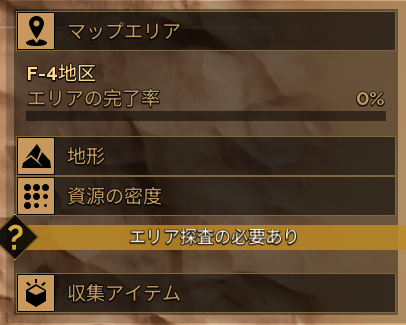


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 =

re 1

F-4地区

LUV ORT

0 2

pi

4人

EW anoze

seu

リが

4  iy,   Ten

<<での

り

| ッ 2あのとの
✅ Found area code: F-4
📌 Detected Area Code: F-4


In [27]:
import requests
from PIL import Image, ImageEnhance, ImageOps
import pytesseract
import io
import re

# 🧪 List of Uploadcare UUIDs to test

# 🔤 OCR correction substitutions
CHAR_SUBS = {
    '=': '-', '—': '-', '–': '-', 'ー': '-',  # Dash forms
    'ト': 'I-', 'Iー': 'I-',                  # OCR variants of I
    'Ｅ': 'E', 'Ｆ': 'F', 'Ｇ': 'G', 'Ｈ': 'H', 'Ａ': 'A', 'Ｂ': 'B',
    'Ｃ': 'C', 'Ｄ': 'D', 'Ｉ': 'I', 'Ｏ': 'O', 'Ｐ': 'P', 'Ｒ': 'R',
    '０': '0', '１': '1', '２': '2', '３': '3', '４': '4',
    '５': '5', '６': '6', '７': '7', '８': '8', '９': '9',
}

def apply_char_subs(text, subs=CHAR_SUBS):
    """Substitute common OCR misreads with intended characters."""
    for wrong, correct in subs.items():
        text = text.replace(wrong, correct)
    return text

def normalize_area_code(letter: str, number: str) -> str:
    """Normalize OCR'd area code like ト6 to I-6 format."""
    if letter in ['ト', 'I', 'i']:
        letter = 'I'
    return f"{letter.upper()}-{number}"

def extract_area_code_from_text(text: str) -> str | None:
    """Extract and normalize area code (e.g., A-1) near keywords."""
    cleaned_text = apply_char_subs(text)
    context_keywords = ['地区', '地図', '地帯']
    context_window = 40
    code_pattern = re.compile(r'([A-Z]|I|ト)[\-ー=–—]{0,1}(\d)', re.IGNORECASE)

    for match in code_pattern.finditer(cleaned_text):
        start_idx = match.start()
        nearby_text = cleaned_text[start_idx:start_idx + context_window]
        if any(kw in nearby_text for kw in context_keywords):
            return normalize_area_code(*match.groups())

    return None

def preprocess_image(image: Image.Image) -> Image.Image:
    """Resize, convert to grayscale, enhance contrast, binarize."""
    base_height = 1024
    h_percent = base_height / float(image.height)
    w_size = int(image.width * h_percent)
    image = image.resize((w_size, base_height))
    print(f"\n🔧 Resized image to {image.size}")

    image = image.convert("L")  # Grayscale
    image = ImageEnhance.Contrast(image).enhance(2.0)  # More contrast
    image = image.point(lambda x: 0 if x < 128 else 255, "1")  # Binarize
    return image

def process_image(uuid: str):
    url = f"https://ucarecdn.com/{uuid}/"
    print(f"\n🔍 Processing {uuid}")
    response = requests.get(url)
    if response.status_code != 200:
        print(f"❌ Failed to fetch image: {response.status_code}")
        return

    image = Image.open(io.BytesIO(response.content))
    processed = preprocess_image(image)
    display(image)

    custom_config = r'--psm 11'
    lang = 'jpn+eng'
    text = pytesseract.image_to_string(processed, lang=lang, config=custom_config)

    print(f"\n🧠 Using OCR config: lang='{lang}', config='{custom_config}'")
    print("📝 OCR Text:\n", text.strip())

    area_code = extract_area_code_from_text(text)
    if area_code:
        print(f"✅ Found area code: {area_code}")
    else:
        print("⚠️ No area code found in text.")
    print(f"📌 Detected Area Code: {area_code if area_code else '[None]'}")

# 🔁 Run the test
if __name__ == "__main__":
    for uuid in TEST_UUIDS:
        process_image(uuid)


🔍 Processing 2692560f-f165-4cfa-8c9c-b0aa269e5b9b

🔧 Resized image to (764, 1024)


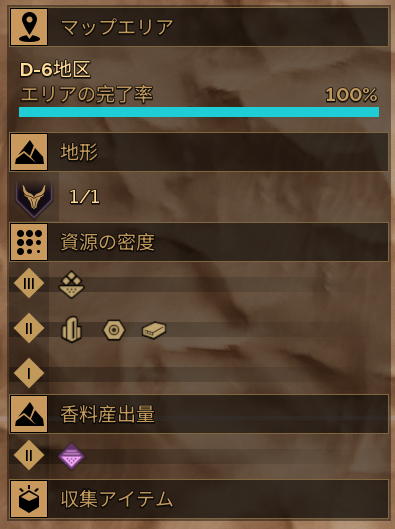


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 22220

D-6地区

na Ay ae =

100%

So Bi

1/1

33: ET ona

oe

0 ht oO る

人る

香料産出量

54

| 収集アイテム
✅ Found area code: D-6
📌 Detected Area Code: D-6

🔍 Processing fca911f4-377d-42ce-8513-8c7c8802d53a

🔧 Resized image to (927, 1024)


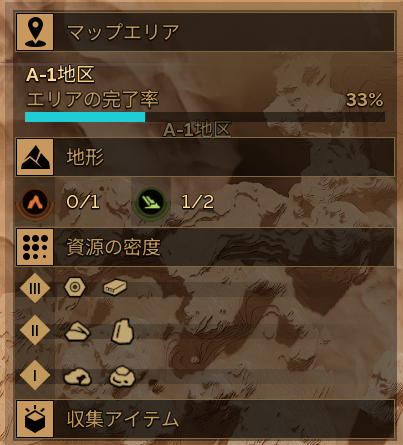


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 A-1地区

33%

PaO ae

es eee

人

pi

HW)

入 0ノZ1

Ss

Wa

$33] 資源の密度

i

ae)

Ee

て

に

Co
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing 859048ba-e6d9-46c4-ae22-5ac78f10e7af

🔧 Resized image to (927, 1024)


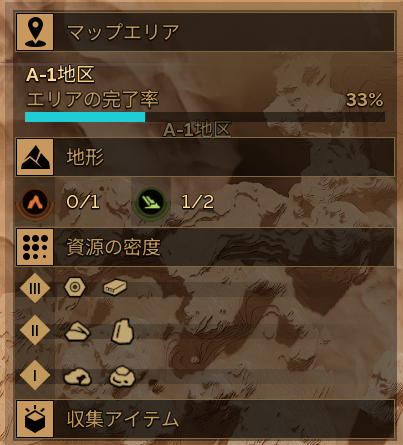


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 A-1地区

33%

PaO ae

es eee

人

pi

HW)

入 0ノZ1

Ss

Wa

$33] 資源の密度

i

ae)

Ee

て

に

Co
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing a560377f-3ab8-44ec-b3d8-96fc6edc485d

🔧 Resized image to (768, 1024)


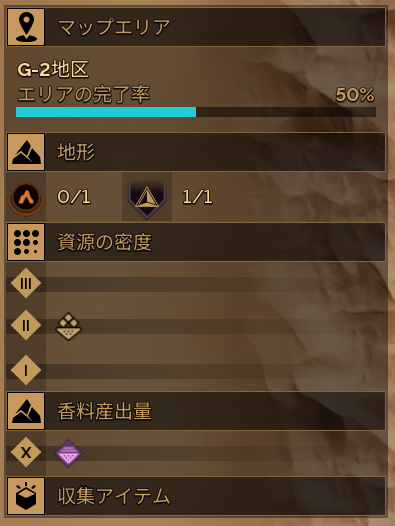


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 G-2地区

エリア 4のと

50%

ーーー

回時 し

reer al

3

1/1

和泊の補度

®

ママ

Ox

aE eae            ー
✅ Found area code: G-2
📌 Detected Area Code: G-2

🔍 Processing 7aaf57ec-1e10-4c3e-ae6b-c4bbf9c3549e

🔧 Resized image to (770, 1024)


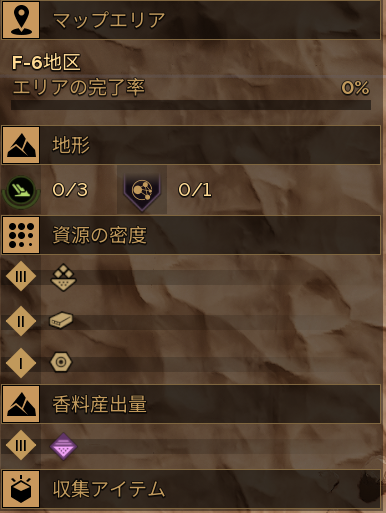


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 F-6地区

エリアの完了率

02%

&

0/3

の

0/1

$3? epee

トス2

i

に

i
✅ Found area code: F-6
📌 Detected Area Code: F-6

🔍 Processing 01017658-c7b4-4593-905f-4d23d94c3e09

🔧 Resized image to (1275, 1024)


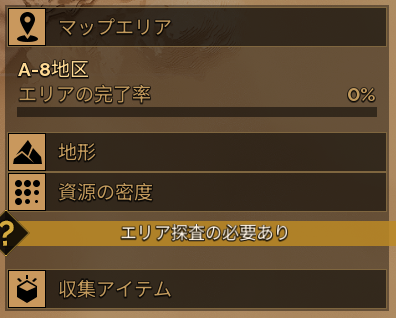


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 ーー

A-8地区

エリアの完了率

ey

sa

4

$32  資源の密度

ごいっす

GPU

YF

any

<

り

Fal errs.
✅ Found area code: A-8
📌 Detected Area Code: A-8

🔍 Processing 0cd19e9e-7dfe-4bc1-8174-9a9ae58435b3

🔧 Resized image to (1107, 1024)


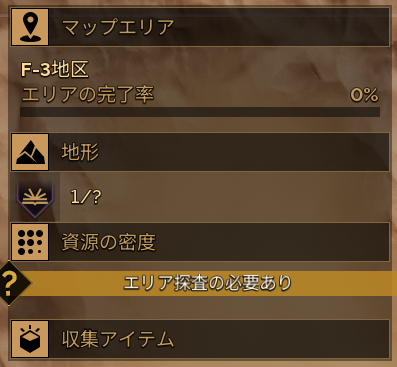


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 F-3地区

AOE me

Or

人

SHA

ee A

Je のの

D

GPU

DF

7リン

<ごに>っ

red

り

 とみ4
✅ Found area code: F-3
📌 Detected Area Code: F-3

🔍 Processing f057d552-6759-4775-88c3-fb464e37c629

🔧 Resized image to (855, 1024)


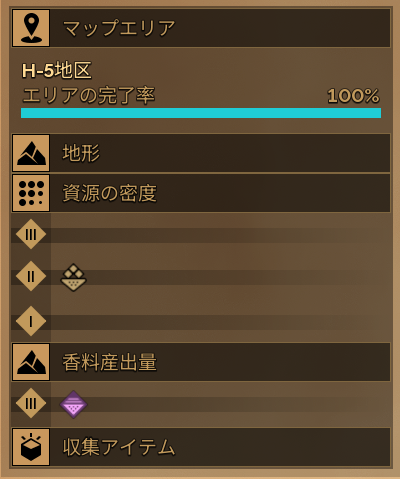


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 H-5地区

エリアの完了率

100%

人る

地形

$23| =e Oars

} a

人

にあらcm

Vv

Fy werrs.
✅ Found area code: H-5
📌 Detected Area Code: H-5

🔍 Processing 2318f874-8c97-439d-b40f-3a280f5ca5cd

🔧 Resized image to (1101, 1024)


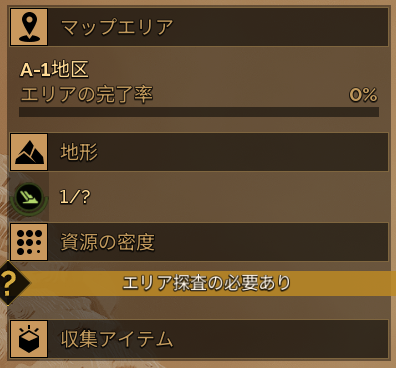


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 A-1地区

エリアの完了率

O%

人

pi

We

レン

$32] 資源の密度

GPU

DF

andy

roan

reed

り

Ey werss.
✅ Found area code: A-1
📌 Detected Area Code: A-1

🔍 Processing d553053c-54ee-43aa-9a1c-83b58a2b6ba6

🔧 Resized image to (1101, 1024)


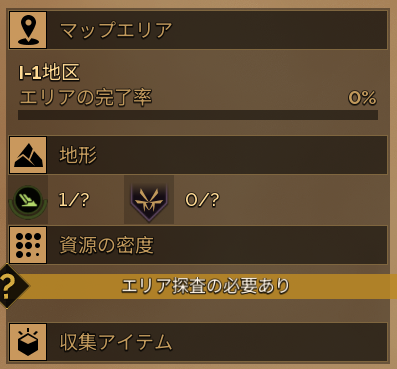


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 11地区

エリアの完了率

or

subi

4

いつ

レグ

を

0/?

$32] 資源の密度

rece

GPU

VF

7リル

<とぴの

り

© あと4
✅ Found area code: I-1
📌 Detected Area Code: I-1

🔍 Processing bad9bd3c-bdca-4729-90a6-8b8da3244ed9

🔧 Resized image to (776, 1024)


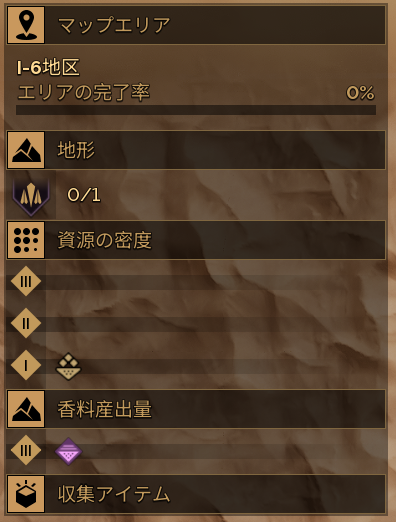


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 6地区

リフ の完了率

(ors

かUI

O/1

33: etwas

0 =

の 香料産出量
⚠️ No area code found in text.
📌 Detected Area Code: [None]

🔍 Processing cb6ebd7f-139b-4d75-ba5c-2e1f536d15ca

🔧 Resized image to (1266, 1024)


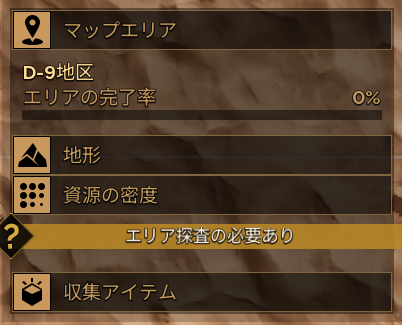


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 D-9地区

エリアの完了率

Or

4

pi

Le  AROBE

SF0

YF

4   WEST ea

ロッ)

め

加emze
✅ Found area code: D-9
📌 Detected Area Code: D-9

🔍 Processing 6b84ff2a-f8eb-4553-9296-7ab7d0051839

🔧 Resized image to (1279, 1024)


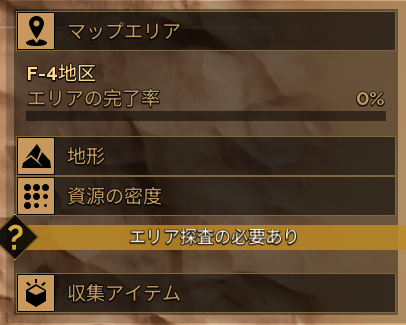


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 =

re 1

F-4地区

LUV ORT

0 2

pi

4人

EW anoze

seu

リが

4  iy,   Ten

<<での

り

| ッ 2あのとの
✅ Found area code: F-4
📌 Detected Area Code: F-4

🔍 Processing 3d634b57-de75-47a2-a51c-39f184c6341f

🔧 Resized image to (1259, 1024)


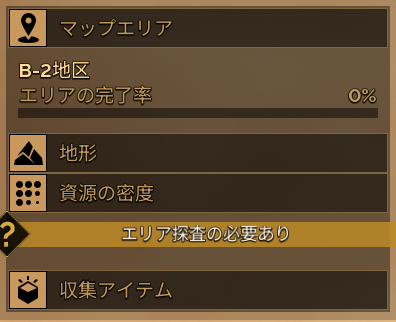


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 B-2地区

エリアの完了率

0 2

人る

SOA

33: Rr toeeas

ごこいーッ

GPU

YF

7のリル

り

 収集アイテム
✅ Found area code: B-2
📌 Detected Area Code: B-2

🔍 Processing 7ad6e4e1-d9fc-43d4-84f4-232fb8b8b46f

🔧 Resized image to (1264, 1024)


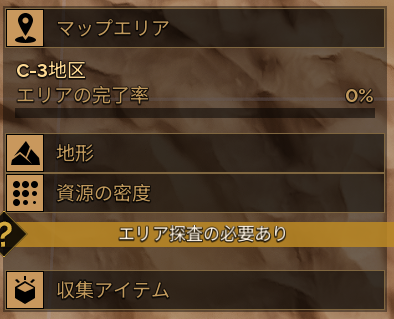


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 ・

C-3地区

エリアの完了率

9 3

HOF

4

332 Ettore

se

YF;

any

myににここーマ

イッ|

り
✅ Found area code: C-3
📌 Detected Area Code: C-3

🔍 Processing 3d1d6c84-04ff-4450-af0b-9d7b9186fb1d

🔧 Resized image to (1264, 1024)


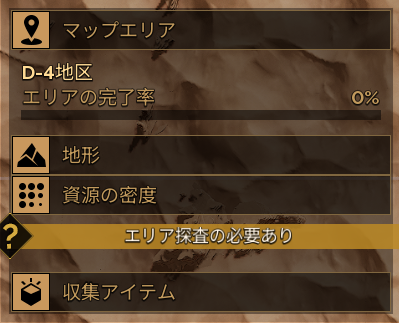


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 D-4地区

LUVORSE

9 2

pi

ae

je  資源の密度

se

UF

イ   NZにここいっーッ

スッ)

り
✅ Found area code: D-4
📌 Detected Area Code: D-4

🔍 Processing 22a94d90-e215-4f1b-b2bb-7435297b8d41

🔧 Resized image to (767, 1024)


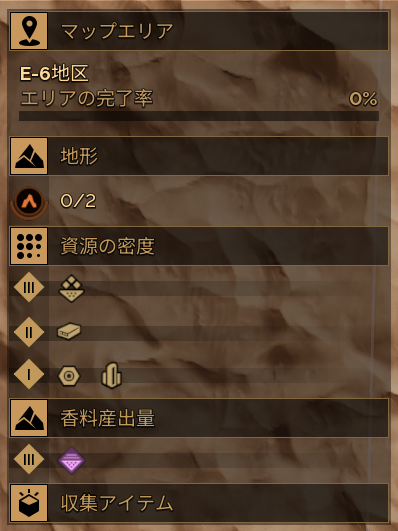


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 回

E-6地区

エリアの完了率

0% *

人る

の

ran OAs

33: REE ona

oe

1

Oo th

人る

におhe

Ki «

| 収集アイテム
✅ Found area code: E-6
📌 Detected Area Code: E-6

🔍 Processing 25435605-31fc-4a32-ae9f-8caa4dce0b81

🔧 Resized image to (1280, 1024)


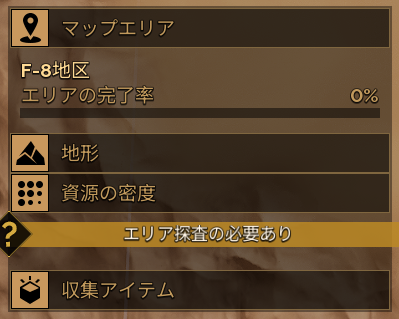


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 F-8地区

SA mes

9 3

pu

ae

Ea  資源の密度

sr

YF

ON PKEESE

<での

り
✅ Found area code: F-8
📌 Detected Area Code: F-8

🔍 Processing d9c35f06-64c5-46c1-9d74-c9f92dbc55b3

🔧 Resized image to (1269, 1024)


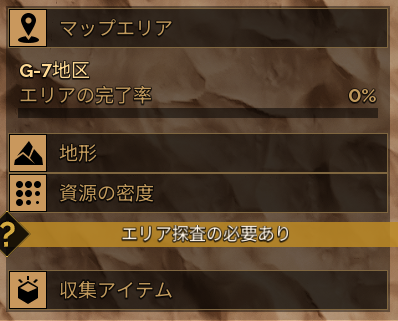


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 ey Ube

エリアの完了率

9 アバ

HOR

4

EW anoze

te oe

seu

DF;

OAYIK,

2th)

Y

| 収集アイテム
⚠️ No area code found in text.
📌 Detected Area Code: [None]


In [29]:
import requests
from PIL import Image, ImageEnhance, ImageOps
import pytesseract
import io
import re

# 🔤 OCR correction substitutions
CHAR_SUBS = {
    '=': '-', '—': '-', '–': '-', 'ー': '-',         # Dash forms
    'ト': 'I-', 'Iー': 'I-',                         # OCR variants of I
    'l-': 'I-', '1-': 'I-', 'i-': 'I-',              # lowercase l, 1, i misreads
    'Ｅ': 'E', 'Ｆ': 'F', 'Ｇ': 'G', 'Ｈ': 'H',
    'Ａ': 'A', 'Ｂ': 'B', 'Ｃ': 'C', 'Ｄ': 'D', 'Ｉ': 'I',
    'Ｏ': 'O', 'Ｐ': 'P', 'Ｒ': 'R',
    '０': '0', '１': '1', '２': '2', '３': '3',
    '４': '4', '５': '5', '６': '6', '７': '7',
    '８': '8', '９': '9',
}

def apply_char_subs(text, subs=CHAR_SUBS):
    """Substitute common OCR misreads with intended characters."""
    for wrong, correct in subs.items():
        text = text.replace(wrong, correct)
    return text

def normalize_area_code(letter: str, number: str) -> str:
    """Normalize OCR'd area code like ト6 to I-6 format."""
    if letter in ['ト', 'I', 'i', 'l', '1']:
        letter = 'I'
    return f"{letter.upper()}-{number}"

def extract_area_code_from_text(text: str) -> str | None:
    """Extract and normalize area code (e.g., A-1) near keywords."""
    cleaned_text = apply_char_subs(text)
    context_keywords = ['地区', '地図', '地帯']
    context_window = 40
    code_pattern = re.compile(r'([A-Z]|I|ト|i|l|1)[\-ー=–—]{0,1}(\d)', re.IGNORECASE)

    for match in code_pattern.finditer(cleaned_text):
        start_idx = match.start()
        nearby_text = cleaned_text[start_idx:start_idx + context_window]
        if any(kw in nearby_text for kw in context_keywords):
            return normalize_area_code(*match.groups())

    return None

def preprocess_image(image: Image.Image) -> Image.Image:
    """Resize, convert to grayscale, enhance contrast, binarize."""
    base_height = 1024
    h_percent = base_height / float(image.height)
    w_size = int(image.width * h_percent)
    image = image.resize((w_size, base_height))
    print(f"\n🔧 Resized image to {image.size}")

    image = image.convert("L")  # Grayscale
    image = ImageEnhance.Contrast(image).enhance(2.0)  # Enhance contrast
    image = image.point(lambda x: 0 if x < 128 else 255, "1")  # Binarize
    return image

def process_image(uuid: str):
    url = f"https://ucarecdn.com/{uuid}/"
    print(f"\n🔍 Processing {uuid}")
    response = requests.get(url)
    if response.status_code != 200:
        print(f"❌ Failed to fetch image: {response.status_code}")
        return

    image = Image.open(io.BytesIO(response.content))
    processed = preprocess_image(image)
    display(image)

    custom_config = r'--psm 11'
    lang = 'jpn+eng'
    text = pytesseract.image_to_string(processed, lang=lang, config=custom_config)

    print(f"\n🧠 Using OCR config: lang='{lang}', config='{custom_config}'")
    print("📝 OCR Text:\n", text.strip())

    area_code = extract_area_code_from_text(text)
    if area_code:
        print(f"✅ Found area code: {area_code}")
    else:
        print("⚠️ No area code found in text.")
    print(f"📌 Detected Area Code: {area_code if area_code else '[None]'}")

# 🔁 Run the test (define TEST_UUIDS in a separate cell before running)
if __name__ == "__main__":
    for uuid in TEST_UUIDS:
        process_image(uuid)


🔍 Processing d9c35f06-64c5-46c1-9d74-c9f92dbc55b3

🔧 Resized image to (1269, 1024)


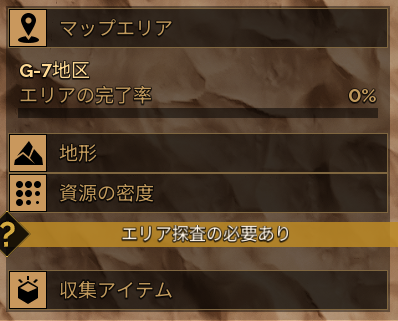


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 |? aed

es 7地図

に

POSTE.

iy

62

了

WAL taeプー

acy) AS

pest

x 収集アイテム

🧠 Using OCR config: lang='jpn+eng', config='--psm 6'
📝 OCR Text:
 SS eee  I ee
{2 マップエリア
] G7地図       電        >
DO = ls、      os
 地形
$32] AROBE
の         SEW) FARE DUETS)
| ean
✅ Found area code: G-7
📌 Detected Area Code: G-7

🔍 Processing bad9bd3c-bdca-4729-90a6-8b8da3244ed9

🔧 Resized image to (776, 1024)


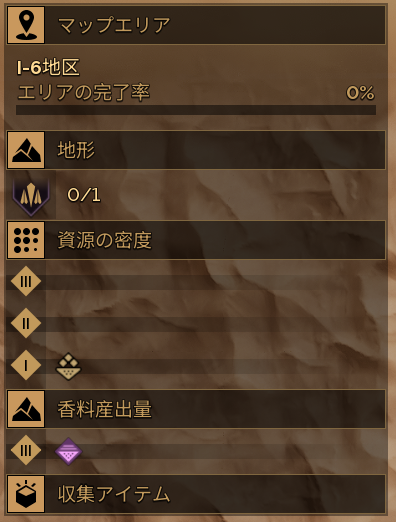


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 Seen.

1-630

BEAD y iGeS

O*%

|

  地形

か

9ア4

い ora

トス4

人

Sh zh

a

| WEP TFL

🧠 Using OCR config: lang='jpn+eng', config='--psm 6'
📝 OCR Text:
 F6地区|

エリアの完玉率            Oy
a
MM O71

7

と                    ‘
Se          の        |
0 >                 *
✅ Found area code: F-6
📌 Detected Area Code: F-6

🔍 Processing 25435605-31fc-4a32-ae9f-8caa4dce0b81

🔧 Resized image to (1280, 1024)


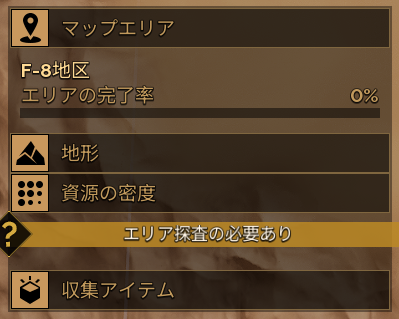


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 FE8地図*

Be) TMD Sates

6 2?

ac acl プスのES の

1

 あと
✅ Found area code: E-8
📌 Detected Area Code: E-8

🔍 Processing 6b84ff2a-f8eb-4553-9296-7ab7d0051839

🔧 Resized image to (1279, 1024)


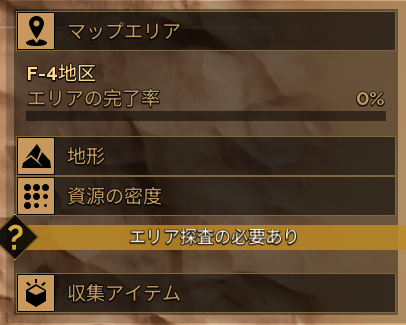


🧠 Using OCR config: lang='jpn+eng', config='--psm 11'
📝 OCR Text:
 | 9 eee

a

F-4地区

用 エリアの完末率

Oe

ac ac PARE NOLEEZOO

be   収集アイテム
✅ Found area code: F-4
📌 Detected Area Code: F-4


In [35]:
import requests
from PIL import Image, ImageEnhance, ImageOps
import pytesseract
import io
import re
import os

# 🔤 OCR correction substitutions
CHAR_SUBS = {
    '=': '-', '—': '-', '–': '-', 'ー': '-',         # Dash forms
    'ト': 'I-', 'Iー': 'I-',                         # OCR variants of I with dashes
    'l-': 'I-', '1-': 'I-', 'i-': 'I-',              # lowercase l, 1, i misreads with dashes
    'Ｅ': 'E', 'Ｆ': 'F', 'Ｇ': 'G', 'Ｈ': 'H',
    'Ａ': 'A', 'Ｂ': 'B', 'Ｃ': 'C', 'Ｄ': 'D', 'Ｉ': 'I',
    'Ｏ': 'O', 'Ｐ': 'P', 'Ｒ': 'R',
    '０': '0', '１': '1', '２': '2', '３': '3',
    '４': '4', '５': '5', '６': '6', '７': '7',
    '８': '8', '９': '9',
}

def apply_char_subs(text, subs=CHAR_SUBS):
    """Substitute common OCR misreads with intended characters."""
    for wrong, correct in subs.items():
        text = text.replace(wrong, correct)
    return text

def normalize_area_code(letter: str, number: str) -> str:
    """Normalize OCR'd area code like ト6 to I-6 format."""
    if letter in ['ト', 'i', 'l', '1']:
        letter = 'I'  # Only clearly invalid characters become I
    return f"{letter.upper()}-{number}"

def extract_area_code_from_text(text: str) -> str | None:
    cleaned_text = apply_char_subs(text)
    context_keywords = ['地区', '地図', '地帯']
    context_window = 40
    code_pattern = re.compile(r'([A-Z]|ト|i|l|1)[\-ー=–—]{0,1}(\d)', re.IGNORECASE)

    for match in code_pattern.finditer(cleaned_text):
        start_idx = match.start()
        nearby_text = cleaned_text[start_idx:start_idx + context_window]
        if any(kw in nearby_text for kw in context_keywords):
            return normalize_area_code(*match.groups())

    return None

def preprocess_image(image: Image.Image) -> Image.Image:
    """Resize, grayscale, enhance contrast, and autocontrast (no hard threshold)."""
    base_height = 1024
    h_percent = base_height / float(image.height)
    w_size = int(image.width * h_percent)
    image = image.resize((w_size, base_height))
    print(f"\n🔧 Resized image to {image.size}")

    image = ImageOps.grayscale(image)
    image = ImageEnhance.Contrast(image).enhance(2.5)
    image = ImageOps.autocontrast(image, cutoff=1)  # Preserve subtle contrast
    return image

def process_image(uuid: str, debug_save: bool = True):
    url = f"https://ucarecdn.com/{uuid}/"
    print(f"\n🔍 Processing {uuid}")
    response = requests.get(url)
    if response.status_code != 200:
        print(f"❌ Failed to fetch image: {response.status_code}")
        return

    image = Image.open(io.BytesIO(response.content))
    processed = preprocess_image(image)
    display(image)

    # Try multiple OCR configs
    psm_modes = ['--psm 11', '--psm 6', '--psm 3']
    lang = 'jpn+eng'
    area_code = None
    text_output = ""

    for psm in psm_modes:
        text = pytesseract.image_to_string(processed, lang=lang, config=psm)
        code = extract_area_code_from_text(text)
        print(f"\n🧠 Using OCR config: lang='{lang}', config='{psm}'")
        print("📝 OCR Text:\n", text.strip())
        if code:
            area_code = code
            break
        text_output = text  # Save last text if none found

    if area_code:
        print(f"✅ Found area code: {area_code}")
    else:
        print("⚠️ No area code found in text.")
        if debug_save:
            os.makedirs("debug_failures", exist_ok=True)
            processed.save(f"debug_failures/{uuid}_processed.png")
            print(f"🖼️ Saved preprocessed image for review: debug_failures/{uuid}_processed.png")

    print(f"📌 Detected Area Code: {area_code if area_code else '[None]'}")

# Example:
if __name__ == "__main__":
    TEST_UUIDS = [
        "d9c35f06-64c5-46c1-9d74-c9f92dbc55b3",  # G-7 example
        "bad9bd3c-bdca-4729-90a6-8b8da3244ed9",  # I-6 example
        "25435605-31fc-4a32-ae9f-8caa4dce0b81",  # F-8 example
        "6b84ff2a-f8eb-4553-9296-7ab7d0051839"   # F-4 example
    ]
    for uuid in TEST_UUIDS:
        process_image(uuid)